In [1]:
import os 

os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="0"
#os.environ["CUDA_LAUNCH_BLOCKING"] = 1

import random
import numpy as np
import matplotlib.pyplot as plt

import json
import cv2
from tqdm import tqdm
from PIL import Image

PATH = "/home/faisal/6.IDRiD"
train_image_dir = os.path.join(PATH, "training/images")
train_ann_dir = os.path.join(PATH, "training/ground_truth/Hard Exudates")
val_image_dir = os.path.join(PATH, "validation/images")
val_ann_dir = os.path.join(PATH, "validation/ground_truth/Hard Exudates")
test_image_dir = os.path.join(PATH, "test/images")
test_ann_dir = os.path.join(PATH, "test/ground_truth/Hard Exudates")
train_image_names = sorted(os.listdir(train_image_dir))
train_ann_names = sorted(os.listdir(train_ann_dir))
val_image_names = sorted(os.listdir(val_image_dir))
val_ann_names = sorted(os.listdir(val_ann_dir))
test_image_names = sorted(os.listdir(test_image_dir))
test_ann_names = sorted(os.listdir(test_ann_dir))



import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms.functional as TF 
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

class SEGDataset(Dataset):
    def __init__(self, image_dir, ann_dir, image_names_list, ann_names_list, transform = None):
        super(SEGDataset, self).__init__()
        self.image_dir = image_dir
        self.ann_dir = ann_dir
        self.images = image_names_list
        self.anns = ann_names_list
        self.transform = transform
    def __len__(self):
        return len(self.images)
    def __getitem__(self, index):
        image_path = os.path.join(self.image_dir, self.images[index])
        ann_path = os.path.join(self.ann_dir, self.anns[index])
        
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        mask = cv2.imread(ann_path, cv2.IMREAD_GRAYSCALE)
        #mask = Image.open(ann_path)
        #mask = np.array(mask)
        mask[mask > 1] = 1
        mask[mask < 1] = 0
        '''ann_file = open(ann_path)
        ann_data = json.load(ann_file)
        #tile_example(img_path, mask_rle, ex_id, organ, 
        mask = np.zeros(shape = image.shape[:-1])
        for idx in range(len(ann_data)):
            ann = [np.array(ann_data[idx], dtype = np.int32)]
            cv2.fillPoly(mask, pts = ann, color = (255, 255, 255))'''
        
        # mask[mask >= 128.0] = 1
        # mask[mask < 128.0] = 0
        
        if self.transform is not None:
            transformer = self.transform(image = image, mask = mask)
            image, mask = transformer["image"], transformer["mask"]
            
        return image, mask
    
#Splitting into train and val sets
random.seed(53)
np.random.seed(53)
torch.manual_seed(53)
'''np.random.shuffle(image_names)
N = len(image_names)
train_len = int(0.9 * N)
val_len = N - train_len'''
#train_image_names = image_names[:train_len]
#val_image_names = image_names[train_len:]
#print(f"No. of training images = {train_len}")
#print(f"No. of validation images = {val_len}")

def get_dataloaders(img_size = 256, batch_size = 16, image_dir = None, ann_dir = None, train_image_dir = None, val_ann_dir = None, test_ann_dir = None,
                    train_image_names = None, train_ann_names = None, val_image_names = None, val_ann_names = None, test_image_names = None, test_ann_names = None):
    
    
    train_transforms = A.Compose([
        A.PadIfNeeded(min_height=4288, min_width=4288, p=1),
        A.Resize(height = img_size, width = img_size, always_apply =True),
        A.HorizontalFlip(p = 0.5),
        A.VerticalFlip(p = 0.5),
        A.Rotate(limit = 90, p = 0.5),
        A.Normalize(
        mean = (0, 0, 0), std = (1.0, 1.0, 1.0), max_pixel_value = 255.0
        ),
        ToTensorV2()
    ])
    val_transforms = A.Compose([
        A.PadIfNeeded(min_height=4288, min_width=4288, border_mode=cv2.BORDER_CONSTANT, p=1),
        A.Resize(height = img_size, width = img_size, always_apply =True),
        A.Normalize(
        mean = (0, 0, 0), std = (1.0, 1.0, 1.0), max_pixel_value = 255.0
        ),
        ToTensorV2()
    ])
    test_transforms = A.Compose([
        A.PadIfNeeded(min_height=4288, min_width=4288, border_mode=cv2.BORDER_CONSTANT, p=1),
        A.Resize(height = img_size, width = img_size, always_apply =True),
        A.Normalize(
        mean = (0, 0, 0), std = (1.0, 1.0, 1.0), max_pixel_value = 255.0
        ),
        ToTensorV2()
    ])
    

    train_dataset = SEGDataset(image_dir, ann_dir, train_image_names, train_ann_names, train_transforms)
    val_dataset = SEGDataset(val_image_dir, val_ann_dir, val_image_names, val_ann_names, val_transforms)
    test_dataset = SEGDataset(test_image_dir, test_ann_dir, test_image_names, test_ann_names, test_transforms)

    g_seed = torch.Generator()
    g_seed.manual_seed(0)

    train_loader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True, pin_memory = True, num_workers = 8)
    val_loader = DataLoader(val_dataset, batch_size = batch_size, shuffle = False, pin_memory = True, num_workers = 8)
    test_loader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False, pin_memory = True, num_workers = 8)
    
    return train_loader, val_loader, test_loader

/home/faisal/.conda/envs/faisal/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# MALUNet

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
from torchvision import transforms,datasets
import torch.optim as optim
from torch.autograd import Variable
from torch.optim.lr_scheduler import ReduceLROnPlateau
#from focal_loss.focal_loss import FocalLoss
import torchvision
import sys
#from torchsummary import summary
from ptflops import get_model_complexity_info
from torchinfo import summary
from torchstat import stat
from timm.models.layers import trunc_normal_

import math
import matplotlib.pyplot as plt
import time
from torchvision import models

import torch
import torch.nn as nn
import torch.nn.functional as F


class DepthWiseConv2d(nn.Module):
    def __init__(self, dim_in, dim_out, kernel_size=3, padding=1, stride=1, dilation=1):
        super().__init__()
        
        self.conv1 = nn.Conv2d(dim_in, dim_in, kernel_size=kernel_size, padding=padding, 
                      stride=stride, dilation=dilation, groups=dim_in)
        self.norm_layer = nn.GroupNorm(4, dim_in)
        self.conv2 = nn.Conv2d(dim_in, dim_out, kernel_size=1)

    def forward(self, x):
        return self.conv2(self.norm_layer(self.conv1(x)))

class GatedAttentionUnit(nn.Module):
    def __init__(self, in_c, out_c, kernel_size):
        super().__init__()
        self.w1 = nn.Sequential(
            DepthWiseConv2d(in_c, in_c, kernel_size, padding=kernel_size//2),
            nn.Sigmoid()
        )
        
        self.w2 = nn.Sequential(
            DepthWiseConv2d(in_c, in_c, kernel_size + 2, padding=(kernel_size + 2)//2),
            nn.GELU()
        )
        self.wo = nn.Sequential(
            DepthWiseConv2d(in_c, out_c, kernel_size),
            nn.GELU()
        )
        
        self.cw = nn.Conv2d(in_c, out_c, 1)
        
    def forward(self, x):
        x1, x2 = self.w1(x), self.w2(x)
        out = self.wo(x1 * x2) + self.cw(x)
        return out


class DilatedGatedAttention(nn.Module):
    def __init__(self, in_c, out_c, k_size=3, dilated_ratio=[7, 5, 2, 1]):
        super().__init__()        
        
        self.mda0 = nn.Conv2d(in_c//4, in_c//4, kernel_size=k_size, stride=1, 
                              padding=(k_size+(k_size-1)*(dilated_ratio[0]-1))//2, 
                             dilation=dilated_ratio[0], groups=in_c//4)
        self.mda1 = nn.Conv2d(in_c//4, in_c//4, kernel_size=k_size, stride=1, 
                              padding=(k_size+(k_size-1)*(dilated_ratio[1]-1))//2, 
                             dilation=dilated_ratio[1], groups=in_c//4)
        self.mda2 = nn.Conv2d(in_c//4, in_c//4, kernel_size=k_size, stride=1, 
                              padding=(k_size+(k_size-1)*(dilated_ratio[2]-1))//2, 
                             dilation=dilated_ratio[2], groups=in_c//4)
        self.mda3 = nn.Conv2d(in_c//4, in_c//4, kernel_size=k_size, stride=1, 
                              padding=(k_size+(k_size-1)*(dilated_ratio[3]-1))//2, 
                             dilation=dilated_ratio[3], groups=in_c//4)
        self.norm_layer = nn.GroupNorm(4, in_c)
        self.conv = nn.Conv2d(in_c, in_c, 1)
        
        self.gau = GatedAttentionUnit(in_c, out_c, 3)
        
    def forward(self, x):
        x = torch.chunk(x, 4, dim=1)
        x0 = self.mda0(x[0])
        x1 = self.mda1(x[1])
        x2 = self.mda2(x[2])
        x3 = self.mda3(x[3])
        x = F.gelu(self.conv(self.norm_layer(torch.cat((x0, x1, x2, x3), dim=1))))
        x = self.gau(x)
        return x
    
    
class EAblock(nn.Module):
    def __init__(self, in_c):
        super().__init__()
        
        self.conv1 = nn.Conv2d(in_c, in_c, 1)

        self.k = in_c * 4
        self.linear_0 = nn.Conv1d(in_c, self.k, 1, bias=False)

        self.linear_1 = nn.Conv1d(self.k, in_c, 1, bias=False)
        self.linear_1.weight.data = self.linear_0.weight.data.permute(1, 0, 2)        
        
        self.conv2 = nn.Conv2d(in_c, in_c, 1, bias=False)
        self.norm_layer = nn.GroupNorm(4, in_c)   

    def forward(self, x):
        idn = x
        x = self.conv1(x)

        b, c, h, w = x.size()
        x = x.view(b, c, h*w)   # b * c * n 

        attn = self.linear_0(x) # b, k, n
        attn = F.softmax(attn, dim=-1) # b, k, n

        attn = attn / (1e-9 + attn.sum(dim=1, keepdim=True)) #  # b, k, n
        x = self.linear_1(attn) # b, c, n

        x = x.view(b, c, h, w)
        x = self.norm_layer(self.conv2(x))
        x = x + idn
        x = F.gelu(x)
        return x
    

class Channel_Att_Bridge(nn.Module):
    def __init__(self, c_list, split_att='fc'):
        super().__init__()
        c_list_sum = sum(c_list) - c_list[-1]
        self.split_att = split_att
        self.avgpool = nn.AdaptiveAvgPool2d(1)
        self.get_all_att = nn.Conv1d(1, 1, kernel_size=3, padding=1, bias=False)
        self.att1 = nn.Linear(c_list_sum, c_list[0]) if split_att == 'fc' else nn.Conv1d(c_list_sum, c_list[0], 1)
        self.att2 = nn.Linear(c_list_sum, c_list[1]) if split_att == 'fc' else nn.Conv1d(c_list_sum, c_list[1], 1)
        self.att3 = nn.Linear(c_list_sum, c_list[2]) if split_att == 'fc' else nn.Conv1d(c_list_sum, c_list[2], 1)
        self.att4 = nn.Linear(c_list_sum, c_list[3]) if split_att == 'fc' else nn.Conv1d(c_list_sum, c_list[3], 1)
        self.att5 = nn.Linear(c_list_sum, c_list[4]) if split_att == 'fc' else nn.Conv1d(c_list_sum, c_list[4], 1)
        self.sigmoid = nn.Sigmoid()
        
    def forward(self, t1, t2, t3, t4, t5):
        att = torch.cat((self.avgpool(t1), 
                         self.avgpool(t2), 
                         self.avgpool(t3), 
                         self.avgpool(t4), 
                         self.avgpool(t5)), dim=1)
        att = self.get_all_att(att.squeeze(-1).transpose(-1, -2))
        if self.split_att != 'fc':
            att = att.transpose(-1, -2)
        att1 = self.sigmoid(self.att1(att))
        att2 = self.sigmoid(self.att2(att))
        att3 = self.sigmoid(self.att3(att))
        att4 = self.sigmoid(self.att4(att))
        att5 = self.sigmoid(self.att5(att))
        if self.split_att == 'fc':
            att1 = att1.transpose(-1, -2).unsqueeze(-1).expand_as(t1)
            att2 = att2.transpose(-1, -2).unsqueeze(-1).expand_as(t2)
            att3 = att3.transpose(-1, -2).unsqueeze(-1).expand_as(t3)
            att4 = att4.transpose(-1, -2).unsqueeze(-1).expand_as(t4)
            att5 = att5.transpose(-1, -2).unsqueeze(-1).expand_as(t5)
        else:
            att1 = att1.unsqueeze(-1).expand_as(t1)
            att2 = att2.unsqueeze(-1).expand_as(t2)
            att3 = att3.unsqueeze(-1).expand_as(t3)
            att4 = att4.unsqueeze(-1).expand_as(t4)
            att5 = att5.unsqueeze(-1).expand_as(t5)
            
        return att1, att2, att3, att4, att5
    
    
class Spatial_Att_Bridge(nn.Module):
    def __init__(self):
        super().__init__()
        self.shared_conv2d = nn.Sequential(nn.Conv2d(2, 1, 7, stride=1, padding=9, dilation=3),
                                          nn.Sigmoid())
    
    def forward(self, t1, t2, t3, t4, t5):
        t_list = [t1, t2, t3, t4, t5]
        att_list = []
        for t in t_list:
            avg_out = torch.mean(t, dim=1, keepdim=True)
            max_out, _ = torch.max(t, dim=1, keepdim=True)
            att = torch.cat([avg_out, max_out], dim=1)
            att = self.shared_conv2d(att)
            att_list.append(att)
        return att_list[0], att_list[1], att_list[2], att_list[3], att_list[4]

    
class SC_Att_Bridge(nn.Module):
    def __init__(self, c_list, split_att='fc'):
        super().__init__()
        
        self.catt = Channel_Att_Bridge(c_list, split_att=split_att)
        self.satt = Spatial_Att_Bridge()
        
    def forward(self, t1, t2, t3, t4, t5):
        r1, r2, r3, r4, r5 = t1, t2, t3, t4, t5

        satt1, satt2, satt3, satt4, satt5 = self.satt(t1, t2, t3, t4, t5)
        t1, t2, t3, t4, t5 = satt1 * t1, satt2 * t2, satt3 * t3, satt4 * t4, satt5 * t5

        r1_, r2_, r3_, r4_, r5_ = t1, t2, t3, t4, t5
        t1, t2, t3, t4, t5 = t1 + r1, t2 + r2, t3 + r3, t4 + r4, t5 + r5

        catt1, catt2, catt3, catt4, catt5 = self.catt(t1, t2, t3, t4, t5)
        t1, t2, t3, t4, t5 = catt1 * t1, catt2 * t2, catt3 * t3, catt4 * t4, catt5 * t5

        return t1 + r1_, t2 + r2_, t3 + r3_, t4 + r4_, t5 + r5_
    
    
class MALUNet(nn.Module):
    
    def __init__(self, num_classes=1, input_channels=3, c_list=[8,16,24,32,48,64], 
                split_att='fc', bridge=True):
        super().__init__()

        self.bridge = bridge
        
        self.encoder1 = nn.Sequential(
            nn.Conv2d(input_channels, c_list[0], 3, stride=1, padding=1),
        )
        self.encoder2 =nn.Sequential(
            nn.Conv2d(c_list[0], c_list[1], 3, stride=1, padding=1),
        ) 
        self.encoder3 = nn.Sequential(
            nn.Conv2d(c_list[1], c_list[2], 3, stride=1, padding=1),
        )
        self.encoder4 = nn.Sequential(
            EAblock(c_list[2]),
            DilatedGatedAttention(c_list[2], c_list[3]),
        )
        self.encoder5 = nn.Sequential(
            EAblock(c_list[3]),
            DilatedGatedAttention(c_list[3], c_list[4]),
        )
        self.encoder6 = nn.Sequential(
            EAblock(c_list[4]),
            DilatedGatedAttention(c_list[4], c_list[5]),
        )

        if bridge: 
            self.scab = SC_Att_Bridge(c_list, split_att)
            print('SC_Att_Bridge was used')
        
        self.decoder1 = nn.Sequential(
            DilatedGatedAttention(c_list[5], c_list[4]),
            EAblock(c_list[4]),
        ) 
        self.decoder2 = nn.Sequential(
            DilatedGatedAttention(c_list[4], c_list[3]),
            EAblock(c_list[3]),
        ) 
        self.decoder3 = nn.Sequential(
            DilatedGatedAttention(c_list[3], c_list[2]),
            EAblock(c_list[2]),
        )  
        self.decoder4 = nn.Sequential(
            nn.Conv2d(c_list[2], c_list[1], 3, stride=1, padding=1),
        )  
        self.decoder5 = nn.Sequential(
            nn.Conv2d(c_list[1], c_list[0], 3, stride=1, padding=1),
        )  
        self.ebn1 = nn.GroupNorm(4, c_list[0])
        self.ebn2 = nn.GroupNorm(4, c_list[1])
        self.ebn3 = nn.GroupNorm(4, c_list[2])
        self.ebn4 = nn.GroupNorm(4, c_list[3])
        self.ebn5 = nn.GroupNorm(4, c_list[4])
        self.dbn1 = nn.GroupNorm(4, c_list[4])
        self.dbn2 = nn.GroupNorm(4, c_list[3])
        self.dbn3 = nn.GroupNorm(4, c_list[2])
        self.dbn4 = nn.GroupNorm(4, c_list[1])
        self.dbn5 = nn.GroupNorm(4, c_list[0])

        self.final = nn.Conv2d(c_list[0], num_classes, kernel_size=1)

        self.apply(self._init_weights)

    def _init_weights(self, m):
        if isinstance(m, nn.Linear):
            trunc_normal_(m.weight, std=.02)
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.Conv1d):
                n = m.kernel_size[0] * m.out_channels
                m.weight.data.normal_(0, math.sqrt(2. / n))
        elif isinstance(m, nn.Conv2d):
            fan_out = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
            fan_out //= m.groups
            m.weight.data.normal_(0, math.sqrt(2.0 / fan_out))
            if m.bias is not None:
                m.bias.data.zero_()

    def forward(self, x):
        
        out = F.gelu(F.max_pool2d(self.ebn1(self.encoder1(x)),2,2))
        t1 = out # b, c0, H/2, W/2

        out = F.gelu(F.max_pool2d(self.ebn2(self.encoder2(out)),2,2))
        t2 = out # b, c1, H/4, W/4 

        out = F.gelu(F.max_pool2d(self.ebn3(self.encoder3(out)),2,2))
        t3 = out # b, c2, H/8, W/8
        
        out = F.gelu(F.max_pool2d(self.ebn4(self.encoder4(out)),2,2))
        t4 = out # b, c3, H/16, W/16
        
        out = F.gelu(F.max_pool2d(self.ebn5(self.encoder5(out)),2,2))
        t5 = out # b, c4, H/32, W/32

        if self.bridge: t1, t2, t3, t4, t5 = self.scab(t1, t2, t3, t4, t5)
        
        out = F.gelu(self.encoder6(out)) # b, c5, H/32, W/32
        
        out5 = F.gelu(self.dbn1(self.decoder1(out))) # b, c4, H/32, W/32
        out5 = torch.add(out5, t5) # b, c4, H/32, W/32
        
        out4 = F.gelu(F.interpolate(self.dbn2(self.decoder2(out5)),scale_factor=(2,2),mode ='bilinear',align_corners=True)) # b, c3, H/16, W/16
        out4 = torch.add(out4, t4) # b, c3, H/16, W/16
        
        out3 = F.gelu(F.interpolate(self.dbn3(self.decoder3(out4)),scale_factor=(2,2),mode ='bilinear',align_corners=True)) # b, c2, H/8, W/8
        out3 = torch.add(out3, t3) # b, c2, H/8, W/8
        
        out2 = F.gelu(F.interpolate(self.dbn4(self.decoder4(out3)),scale_factor=(2,2),mode ='bilinear',align_corners=True)) # b, c1, H/4, W/4
        out2 = torch.add(out2, t2) # b, c1, H/4, W/4 
        
        out1 = F.gelu(F.interpolate(self.dbn5(self.decoder5(out2)),scale_factor=(2,2),mode ='bilinear',align_corners=True)) # b, c0, H/2, W/2
        out1 = torch.add(out1, t1) # b, c0, H/2, W/2
        
        out0 = F.interpolate(self.final(out1),scale_factor=(2,2),mode ='bilinear',align_corners=True) # b, num_class, H, W
        
        return out0

In [3]:
def validate(model, loader, epoch, device = 'cpu'):
    model.eval()
    loss_ep = 0
    dice_coeff_ep = 0.0
    jaccard_indx = 0
    f1_ep = 0
    with torch.no_grad():
        for idx, (images, masks) in enumerate(loader):
            images = images.to(device)
            masks = masks.to(device).long()
            
            outputs = model(images)
            #outputs = F.sigmoid(model(images))
            #criterion = FocalLoss(gamma= 2, alpha = alpha)
            loss = criterion(outputs, masks)
            #loss = criterion(outputs, masks.unsqueeze(1).float())
            _, pred = outputs.max(1)
            #num_correct += (pred == masks).sum()
            #num_samples += pred.size(0)
            #dice_coeff_ep += dice_coeff_binary(pred.detach(), masks.to(device).unsqueeze(1))
            dice_coeff_ep += dice(pred.detach(), masks.to(device).unsqueeze(1), average = 'weighted', num_classes = 2)
            jaccard_indx += ji(pred.detach(), masks.to(device), 'multiclass', num_classes = 2)
            f1_ep += f1_score(pred.detach(), masks.to(device), 'multiclass', average = 'macro', multidim_average= 'global', num_classes = 2)
            loss_ep += loss.item()
    val_loss = loss_ep/len(loader)
    dice_coeff = dice_coeff_ep/len(loader)
    jac_indx = jaccard_indx/len(loader)
    f1 = f1_ep/len(loader)
    return val_loss, dice_coeff, jac_indx , f1

In [4]:
from torchmetrics.functional import jaccard_index as ji
from torchmetrics.functional import dice
from torchmetrics.functional import f1_score

#device = 'cuda' if torch.cuda.is_available() else 'cpu'
device = 'cpu'
img_size = 1024
batch_size = 8

train_loader, val_loader, test_loader = get_dataloaders(img_size, batch_size, train_image_dir, train_ann_dir, val_image_dir, val_ann_dir, test_ann_dir, train_image_names, train_ann_names, val_image_names, val_ann_names, test_image_names, test_ann_names)

#model = MeDiAUNET(in_channels = 3, out_channels = 2 ,features = [64, 128, 256, 512])
#model = MeDiAUNET(in_channels = 3, out_channels = 2)
#model = SUMNet_all_bn(in_ch=3,out_ch=2)


In [5]:
#model = AUNet(in_c=3, n_classes=2, layers=[8,16,32,64], conv_bridge=True, shortcut=True)
model = MALUNet(num_classes=2, input_channels=3, c_list=[8,16,24,32,48,64], split_att='fc', bridge=True)

model.to(device)
#checkpoint_dir = "/home/dipayan/Anupam/IDRiD/Little_AUNet/weights"
#checkpoint_dir = "/home/dipayan/Anupam/IDRiD/SUMNet/weights"
checkpoint_dir = "/home/faisal/MALUNet/Hard Exudates/weights"
#checkpoint_dir = "/home/dipayan/Anupam/IDRiD/UNext/weights"
#checkpoint_dir = "/home/dipayan/Anupam/IDRiD/ResUNet++/weights"
model.load_state_dict(torch.load(os.path.join(checkpoint_dir, "best_weight.tar"), map_location = torch.device('cpu'))["model_state_dict"])
#model.to('cuda')
model.eval()

SC_Att_Bridge was used


MALUNet(
  (encoder1): Sequential(
    (0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (encoder2): Sequential(
    (0): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (encoder3): Sequential(
    (0): Conv2d(16, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (encoder4): Sequential(
    (0): EAblock(
      (conv1): Conv2d(24, 24, kernel_size=(1, 1), stride=(1, 1))
      (linear_0): Conv1d(24, 96, kernel_size=(1,), stride=(1,), bias=False)
      (linear_1): Conv1d(96, 24, kernel_size=(1,), stride=(1,), bias=False)
      (conv2): Conv2d(24, 24, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (norm_layer): GroupNorm(4, 24, eps=1e-05, affine=True)
    )
    (1): DilatedGatedAttention(
      (mda0): Conv2d(6, 6, kernel_size=(3, 3), stride=(1, 1), padding=(7, 7), dilation=(7, 7), groups=6)
      (mda1): Conv2d(6, 6, kernel_size=(3, 3), stride=(1, 1), padding=(5, 5), dilation=(5, 5), groups=6)
      (mda2): Conv2d(6, 6, kerne

In [6]:
from ptflops import get_model_complexity_info
from torchinfo import summary
from torchstat import stat
def test_model():
    mod = MALUNet(num_classes=2, input_channels=3, c_list=[8,16,24,32,48,64], split_att='fc', bridge=True)
    
    #x = torch.randn((1, 3, 512, 512))
    #mod.cuda()
    #pred = mod(x)
    #print(stat(mod, input_size=(3, 512, 512)))
    #print(summary(mod, input_size=(1, 3, 1024, 1024)))
    macs, params = get_model_complexity_info(mod, (3, 1024, 1024),
                                             as_strings=True,
                                             print_per_layer_stat=False)
    print('{:<30}  {:<8}'.format('Computational complexity: ', macs))
    print('{:<30}  {:<8}'.format('Number of parameters: ', params))
    
    #print(pred.shape)

test_model()

SC_Att_Bridge was used
Computational complexity:       1.4 GMac
Number of parameters:           177.95 k


100%|██████████| 8/8 [00:01<00:00,  5.93it/s]


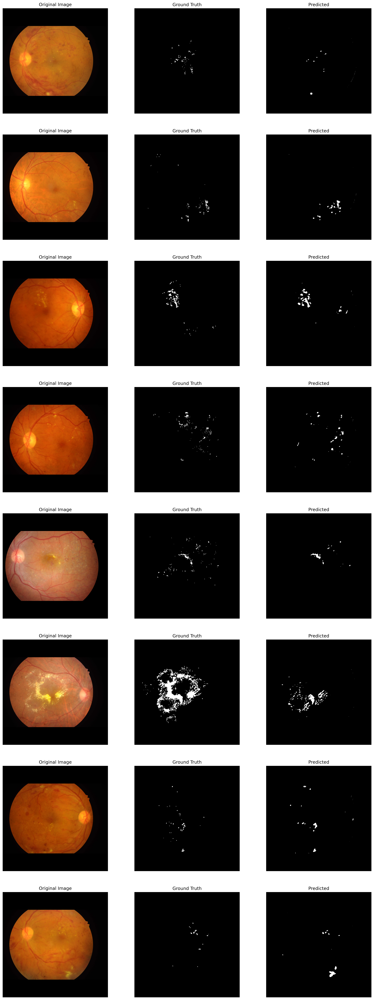

In [7]:

fig, ax = plt.subplots(nrows = 8, ncols = 3, figsize = (18, 8*6), dpi = 300)
imgs, masks = next(iter(test_loader))
for i in tqdm(range(8)):
    dice_coeff_ep = 0
    jaccard_indx =0
    f1_ep = 0
    img = imgs[i]
    mask = masks[i].numpy()
    mask[mask == 1] == 255
    with torch.no_grad():
        output = model(img.unsqueeze(0))
        _, pred_mask = output.max(1)
        pred_mask = pred_mask.squeeze(0).numpy()
        pred_mask[pred_mask == 1] = 255
        # images = imgs[i].to(device)
        # masks = masks[i].to(device).long()
        # outputs = model(images.unsqueeze(0))
        # _, pred = outputs.max(1)

        # dice_coeff_ep = dice(pred.detach(), masks.to(device).unsqueeze(1), average = 'weighted', num_classes = 2)
        # jaccard_indx = ji(pred.detach(), masks.to(device).unsqueeze(1), 2)
        # f1_ep = f1_score(pred.detach(), masks.to(device).unsqueeze(1), average = 'macro', mdmc_average= 'global', num_classes = 2)
        # else:
        #     dice_coeff_ep = dice(pred.detach().float(), masks.to(device).unsqueeze(1))
        #     jaccard_indx = ji(pred.detach().float(), masks.to(device).unsqueeze(1), 2)
        #     f1_ep = f1_score(pred.detach().float(), masks.to(device).unsqueeze(1), average = 'macro', mdmc_average= 'global', num_classes = 2)
    img = img.permute(1,2,0).numpy()
    ax[i,0].imshow(img)
    ax[i,0].set_title('Original Image')
    ax[i,0].axis('off')
    ax[i,1].set_title('Ground Truth')
    ax[i,1].imshow(mask, cmap = 'gray')
    ax[i,1].axis('off')
    ax[i,2].set_title('Predicted')#, dice coeff={dice_coeff_ep}, Jac Index={jaccard_indx}, F1 Score={f1_ep}'.format(dice_coeff_ep=dice_coeff_ep,jaccard_indx=jaccard_indx,f1_ep=f1_ep), fontsize = 10)
    ax[i,2].imshow(pred_mask, cmap = 'gray')
    ax[i,2].axis('off')
plt.savefig('/home/faisal/MALUNet/Hard Exudates/MALUNet_pred_Hard Exudates.png')
plt.show()

In [8]:
criterion = nn.CrossEntropyLoss()
validate(model, test_loader, epoch=1)

(0.022094279062002897, tensor(0.9932), tensor(0.6491), tensor(0.7297))

In [9]:
criterion = nn.CrossEntropyLoss()
validate(model, val_loader, epoch=1)

(0.020338830538094044, tensor(0.9931), tensor(0.6862), tensor(0.7731))